In [ ]:
ct_path = "1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804"
seg_path = "1.3.6.1.4.1.14519.5.2.1.205794812619394519561284507334777252183/1-1.dcm"
SLICE_IDX = 160

import os, numpy as np, pydicom, matplotlib.pyplot as plt
from matplotlib.path import Path

# --- load CT series & pick slice geometry ---
ct_files = [os.path.join(ct_path, f) for f in os.listdir(ct_path) if f.endswith(".dcm")]
ct_dsets = [pydicom.dcmread(f) for f in ct_files]

def zpos(ds):
    try: return float(ds.ImagePositionPatient[2])
    except Exception: return float(getattr(ds, "InstanceNumber", 0))

ct_dsets.sort(key=zpos)
print(ct_files)
imgs = np.stack([ds.pixel_array for ds in ct_dsets]).astype(np.int16)

slope = float(getattr(ct_dsets[0], "RescaleSlope", 1.0))
intercept = float(getattr(ct_dsets[0], "RescaleIntercept", 0.0))
ct_hu = imgs * slope + intercept

# geometry for selected slice
SLICE_IDX = max(0, min(SLICE_IDX, len(ct_dsets)-1))
ds = ct_dsets[SLICE_IDX]
rows, cols = int(ds.Rows), int(ds.Columns)
iop = np.array(ds.ImageOrientationPatient, dtype=float)
row_cos, col_cos = iop[:3], iop[3:]
ipp = np.array(ds.ImagePositionPatient, dtype=float)
ps = np.array(ds.PixelSpacing, dtype=float)
chosen_sop = ds.SOPInstanceUID

# --- read the segmentation DICOM ---
seg = pydicom.dcmread(seg_path)

# --- helpers used below ---
def world_to_rc(points_xyz, origin_xyz, row_cos, col_cos, pix_spacing):
    v = points_xyz - origin_xyz[None, :]
    r = (v @ row_cos) / pix_spacing[0]
    c = (v @ col_cos) / pix_spacing[1]
    return np.stack([r, c], axis=1)

def fill_polygon_mask(rows, cols, poly_rc):
    rr = np.arange(rows) + 0.5
    cc = np.arange(cols) + 0.5
    CC, RR = np.meshgrid(cc, rr)
    pts = np.stack([CC.ravel(), RR.ravel()], axis=1)  # (x=col, y=row)
    path = Path(poly_rc[:, ::-1])
    inside = path.contains_points(pts)
    return inside.reshape(rows, cols)


['1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804/1-013.dcm', '1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804/1-007.dcm', '1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804/1-167.dcm', '1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804/1-173.dcm', '1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804/1-172.dcm', '1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804/1-166.dcm', '1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804/1-006.dcm', '1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804/1-012.dcm', '1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804/1-038.dcm', '1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804/1-004.dcm', '1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804/1-010.dcm', '1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804/1-158.dcm', '1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804/1-170.dcm', '1.3.6.1.4.

In [25]:
print(imgs.shape)

(187, 512, 512)


In [23]:
for rc in getattr(seg, "ROIContourSequence", []):
    for cnt in getattr(rc, "ContourSequence", []):
        cis = getattr(cnt, "ContourImageSequence", [])
        print(cnt.ContourData)

[43.29, 9.46, -72.44, 43.72, 9.4, -72.44, 44, 9.6, -72.44, 44.15, 9.72, -72.44, 44.51, 10.03, -72.44, 44.58, 10.1, -72.44, 44.88, 10.46, -72.44, 45.01, 10.63, -72.44, 45.21, 10.89, -72.44, 45.44, 11.21, -72.44, 45.53, 11.32, -72.44, 45.8, 11.75, -72.44, 45.87, 11.83, -72.44, 46.09, 12.18, -72.44, 46.3, 12.52, -72.44, 46.36, 12.61, -72.44, 46.57, 13.04, -72.44, 46.73, 13.32, -72.44, 46.82, 13.47, -72.44, 46.9, 13.9, -72.44, 46.9, 14.33, -72.44, 46.84, 14.76, -72.44, 46.73, 14.97, -72.44, 46.61, 15.19, -72.44, 46.39, 15.62, -72.44, 46.3, 15.73, -72.44, 46.05, 16.05, -72.44, 45.87, 16.28, -72.44, 45.7, 16.48, -72.44, 45.44, 16.78, -72.44, 45.32, 16.91, -72.44, 45.01, 17.27, -72.44, 44.94, 17.34, -72.44, 44.58, 17.7, -72.44, 44.52, 17.77, -72.44, 44.15, 18.16, -72.44, 44.11, 18.2, -72.44, 43.78, 18.63, -72.44, 43.72, 18.71, -72.44, 43.48, 19.06, -72.44, 43.29, 19.32, -72.44, 43.13, 19.49, -72.44, 42.86, 19.73, -72.44, 42.43, 19.85, -72.44, 42, 19.82, -72.44, 41.57, 19.71, -72.44, 41.14, 19

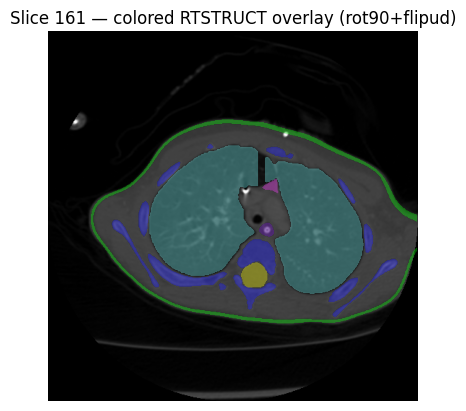

In [17]:
# --- build per-ROI color map (RGB 0..1) ---
roi_colors = {}
for rc in getattr(seg, "ROIContourSequence", []):
    roi_num = int(rc.ReferencedROINumber)
    rgb = getattr(rc, "ROIDisplayColor", None)
    if rgb is not None and len(rgb) == 3:
        roi_colors[roi_num] = tuple([c/255.0 for c in rgb])

# --- collect masks for the chosen slice (RTSTRUCT) ---
roi_masks = {}
for rc in getattr(seg, "ROIContourSequence", []):
    roi_num = int(rc.ReferencedROINumber)
    for cnt in getattr(rc, "ContourSequence", []):
        cis = getattr(cnt, "ContourImageSequence", [])
        if not cis or cis[0].ReferencedSOPInstanceUID != chosen_sop:
            continue
        coords = np.array(cnt.ContourData, dtype=float).reshape(-1, 3)
        poly_rc = world_to_rc(coords, ipp, row_cos, col_cos, ps)
        m = fill_polygon_mask(rows, cols, poly_rc)

        # ---- your orientation fix ----
        m = np.rot90(m, k=1)
        m = np.flipud(m)

        roi_masks.setdefault(roi_num, np.zeros((rows, cols), dtype=bool))
        roi_masks[roi_num] |= m

# (If you're using a DICOM-SEG path instead, apply the same two lines to the 2D mask)
# e.g., for a single-frame 'mask':
# mask = np.rot90(mask, k=1)
# mask = np.flipud(mask)

# --- compose RGBA overlay ---
overlay = np.zeros((rows, cols, 4), dtype=float)
ALPHA = 0.35
for roi_num, m in roi_masks.items():
    color = roi_colors.get(roi_num, (1.0, 0.0, 0.0))
    overlay[m, :3] = color
    overlay[m, 3] = ALPHA

# --- plot --- 
plt.figure()
plt.imshow(ct_hu[SLICE_IDX], cmap="gray")
plt.imshow(overlay)
plt.title(f"Slice {SLICE_IDX+1} — colored RTSTRUCT overlay (rot90+flipud)")
plt.axis("off")
plt.show()


In [5]:
# ============================================================
# Cell 3 — Explore CT + RTSTRUCT metadata & structure contents
# ============================================================

print("=== CT SERIES INFORMATION ===")
print(f"Number of CT slices: {len(ct_dsets)}")
print(f"Image size (rows x cols): {rows} x {cols}")
print(f"Pixel spacing: {ps}")
print(f"Slice thickness: {getattr(ds, 'SliceThickness', 'N/A')}")
print(f"Image orientation (IOP): {iop}")
print(f"Image position (IPP): {ipp}")
print(f"Selected slice index: {SLICE_IDX}")
print(f"Selected SOPInstanceUID: {chosen_sop}\n")


print("=== STUDY / SERIES METADATA ===")
main_ct = ct_dsets[0]
print(f"PatientID: {main_ct.PatientID}")
print(f"StudyInstanceUID: {main_ct.StudyInstanceUID}")
print(f"SeriesInstanceUID (CT): {main_ct.SeriesInstanceUID}")
print(f"Modality: {main_ct.Modality}\n")


print("=== RTSTRUCT OVERVIEW ===")
print(f"Modality: {seg.Modality}")
print(f"StructureSetLabel: {getattr(seg, 'StructureSetLabel', '(none)')}")
print(f"Number of ROIs: {len(seg.StructureSetROISequence)}\n")


print("=== ROI LIST (Names + Display Colors) ===")
for roi in seg.StructureSetROISequence:
    roi_num  = roi.ROINumber
    roi_name = roi.ROIName
    color = roi_colors.get(roi_num, None)
    print(f"ROI {roi_num:2d}: '{roi_name}'   Color: {color}")
print()


print("=== CONTOUR SUMMARY PER ROI ===")
for rc in getattr(seg, "ROIContourSequence", []):
    roi_num = rc.ReferencedROINumber
    name = next(s.ROIName for s in seg.StructureSetROISequence if s.ROINumber == roi_num)
    contour_count = len(getattr(rc, "ContourSequence", []))
    print(f"ROI {roi_num:2d} ('{name}'): {contour_count} contours")
print()


print("=== DETAILED PER-SLICE CONTOUR INFORMATION ===")
# for rc in getattr(seg, "ROIContourSequence", []):
#     roi_num = rc.ReferencedROINumber
#     name = next(s.ROIName for s in seg.StructureSetROISequence if s.ROINumber == roi_num)
    
#     print(f"\n--- ROI {roi_num} ('{name}') ---")

#     for i, cnt in enumerate(getattr(rc, "ContourSequence", [])):
#         cis = getattr(cnt, "ContourImageSequence", [])
#         ref_sop = cis[0].ReferencedSOPInstanceUID if cis else "(none)"
#         pts = np.array(cnt.ContourData).reshape(-1, 3)

#         print(f"  Contour {i+1}:")
#         print(f"     Referenced slice SOP: {ref_sop}")
#         print(f"     Number of points: {len(pts)}")
#         if ref_sop == chosen_sop:
#             print("     -> This contour belongs to the displayed slice!")


=== CT SERIES INFORMATION ===
Number of CT slices: 187
Image size (rows x cols): 512 x 512
Pixel spacing: [0.429688 0.429688]
Slice thickness: 2
Image orientation (IOP): [1. 0. 0. 0. 1. 0.]
Image position (IPP): [-95.5    -68.6    -56.4375]
Selected slice index: 160
Selected SOPInstanceUID: 1.3.6.1.4.1.14519.5.2.1.318810843218987614949260388278059989430

=== STUDY / SERIES METADATA ===
PatientID: Pediatric-CT-SEG-0E3FF02E
StudyInstanceUID: 1.3.6.1.4.1.14519.5.2.1.100029285280147124880119271251031481309
SeriesInstanceUID (CT): 1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804
Modality: CT

=== RTSTRUCT OVERVIEW ===
Modality: RTSTRUCT
StructureSetLabel: pediatric_abdome
Number of ROIs: 29

=== ROI LIST (Names + Display Colors) ===
ROI 25: 'UteroCervix'   Color: (0.9803921568627451, 0.5882352941176471, 0.19607843137254902)
ROI 24: 'Thymus'   Color: (0.9764705882352941, 0.2, 0.9882352941176471)
ROI 23: 'Stomach'   Color: (0.09019607843137255, 0.5529411764705883, 0.384313725490

img_vol shape: (187, 512, 512)
mask_vol shape: (187, 512, 512)
Number of labeled voxels: 16694221


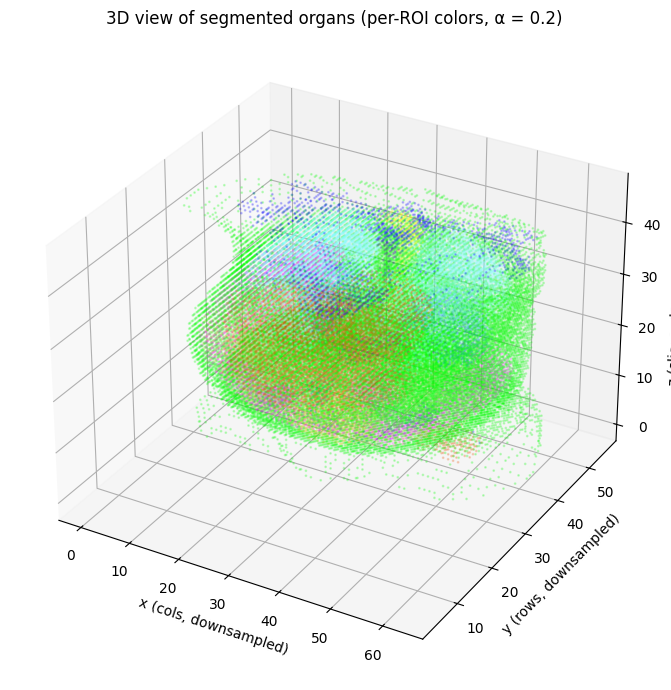

In [7]:
# ============================================================
# Cell 4 — 3D image + 3D label-mask volume + faster 3D plot
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
from matplotlib.path import Path

# ---------- 1) Volume arrays ----------

# CT volume in HU (already computed in previous cells)
img_vol = ct_hu.astype(np.float32)
num_slices, rows, cols = img_vol.shape
print(f"img_vol shape: {img_vol.shape}")

# Label volume: 0 = background, >0 = ROI number
mask_vol = np.zeros_like(img_vol, dtype=np.int16)

# Map SOPInstanceUID -> slice index
sop_to_idx = {ds.SOPInstanceUID: i for i, ds in enumerate(ct_dsets)}

# Pre-cache geometry per slice to avoid recomputing inside contour loop
slice_geom = []
for ds_slice in ct_dsets:
    iop_s = np.array(ds_slice.ImageOrientationPatient, dtype=float)
    row_cos_s, col_cos_s = iop_s[:3], iop_s[3:]
    ipp_s = np.array(ds_slice.ImagePositionPatient, dtype=float)
    ps_s = np.array(ds_slice.PixelSpacing, dtype=float)
    slice_geom.append((row_cos_s, col_cos_s, ipp_s, ps_s))


# ---------- 2) Faster polygon rasterization (bounding-box) ----------

def fill_polygon_mask_bbox(rows, cols, poly_rc):
    """
    Faster rasterization: only test pixels inside the polygon's bounding box.
    poly_rc: Nx2 array of (row, col) in floating coords.
    """
    rmin = max(0, int(np.floor(poly_rc[:, 0].min())))
    rmax = min(rows, int(np.ceil(poly_rc[:, 0].max())) + 1)
    cmin = max(0, int(np.floor(poly_rc[:, 1].min())))
    cmax = min(cols, int(np.ceil(poly_rc[:, 1].max())) + 1)

    if rmin >= rmax or cmin >= cmax:
        return np.zeros((rows, cols), dtype=bool)

    rr = np.arange(rmin, rmax) + 0.5
    cc = np.arange(cmin, cmax) + 0.5
    CC, RR = np.meshgrid(cc, rr)
    pts = np.stack([CC.ravel(), RR.ravel()], axis=1)  # (col, row) order for Path

    path = Path(poly_rc[:, ::-1])  # poly_rc is (row, col); Path wants (x=col, y=row)
    inside_small = path.contains_points(pts)
    m_small = inside_small.reshape(rmax - rmin, cmax - cmin)

    mask = np.zeros((rows, cols), dtype=bool)
    mask[rmin:rmax, cmin:cmax] = m_small
    return mask


# ---------- 3) Build 3D label volume from RTSTRUCT ----------

for rc in getattr(seg, "ROIContourSequence", []):
    roi_num = int(rc.ReferencedROINumber)

    for cnt in getattr(rc, "ContourSequence", []):
        cis = getattr(cnt, "ContourImageSequence", [])
        if not cis:
            continue

        ref_sop = cis[0].ReferencedSOPInstanceUID
        slice_idx = sop_to_idx.get(ref_sop, None)
        if slice_idx is None:
            continue  # contour doesn't belong to this CT series

        row_cos_s, col_cos_s, ipp_s, ps_s = slice_geom[slice_idx]

        # Contour points in 3D world coordinates
        coords = np.array(cnt.ContourData, dtype=float).reshape(-1, 3)

        # Convert to (row, col) coordinates in this slice
        poly_rc = world_to_rc(coords, ipp_s, row_cos_s, col_cos_s, ps_s)

        # Rasterize only inside bounding box
        m2d = fill_polygon_mask_bbox(rows, cols, poly_rc)

        # Apply same orientation fix as in Cell 2
        m2d = np.rot90(m2d, k=1)
        m2d = np.flipud(m2d)

        # Write ROI label into volume (0 = background)
        slice_labels = mask_vol[slice_idx]
        slice_labels[m2d] = roi_num
        mask_vol[slice_idx] = slice_labels

print(f"mask_vol shape: {mask_vol.shape}")
print(f"Number of labeled voxels: {(mask_vol > 0).sum()}")


# ---------- 4) 3D visualization with per-ROI colors & alpha=0.2 ----------

# Heavy downsampling for visualization
ds_z = 4   # slice direction
ds_y = 8   # rows
ds_x = 8   # cols

mask_ds = mask_vol[::ds_z, ::ds_y, ::ds_x]
z_idx, y_idx, x_idx = np.nonzero(mask_ds)
roi_ids = mask_ds[z_idx, y_idx, x_idx]

# Optional: random subsampling to keep plotting fast
max_points = 50000
num_points = len(z_idx)
if num_points > max_points:
    rng = np.random.default_rng(0)
    sel = rng.choice(num_points, size=max_points, replace=False)
    z_idx = z_idx[sel]
    y_idx = y_idx[sel]
    x_idx = x_idx[sel]
    roi_ids = roi_ids[sel]

# Build a color array for each point using roi_colors
colors = []
for r in roi_ids:
    base_color = roi_colors.get(int(r), (0.0, 0.0, 1.0))  # default blue
    colors.append(base_color)
colors = np.array(colors)

fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection="3d")

ax.scatter(
    x_idx, y_idx, z_idx,
    c=colors,
    s=1,
    alpha=0.2  # global transparency of segmented organs
)

ax.set_xlabel("x (cols, downsampled)")
ax.set_ylabel("y (rows, downsampled)")
ax.set_zlabel("z (slices, downsampled)")
ax.set_title("3D view of segmented organs (per-ROI colors, α = 0.2)")

plt.tight_layout()
plt.show()


In [45]:
import os
import numpy as np
import matplotlib.pyplot as plt

# -------- choose an output folder --------
out_dir = "exports"
os.makedirs(out_dir, exist_ok=True)

# -------- window & normalize the CT slice to 0..1 for saving --------
def window_img(img, center=40, width=400):
    lo = center - width / 2.0
    hi = center + width / 2.0
    img_w = np.clip(img, lo, hi)
    return (img_w - lo) / (hi - lo + 1e-8)

ct_norm = window_img(ct_hu[SLICE_IDX], center=40, width=400)  # tweak if needed

# -------- save grayscale CT slice (no overlay) --------
ct_path = os.path.join(out_dir, f"ct_slice_{SLICE_IDX+1:03d}.png")
plt.imsave(ct_path, ct_norm, cmap="gray")
print("Saved CT:", ct_path)

# -------- build a single COLORED mask with transparent background --------
# roi_masks: dict[roi_num] -> 2D bool mask (already rotated/flipped as you did)
# roi_colors: dict[roi_num] -> (r,g,b) in 0..1 from ROIDisplayColor/255
colored_mask = np.zeros((rows, cols, 4), dtype=float)  # RGBA
ALPHA = 1.0  # fully opaque mask; set <1.0 if you want translucency

# if some ROIs don't have a color, fall back to a simple palette
fallback_palette = [
    (1.0, 0.0, 0.0),  # red
    (0.0, 1.0, 0.0),  # green
    (0.0, 0.0, 1.0),  # blue
    (1.0, 1.0, 0.0),  # yellow
    (1.0, 0.0, 1.0),  # magenta
    (0.0, 1.0, 1.0),  # cyan
]
fallback_idx = 0

for roi_num, m in roi_masks.items():
    color = roi_colors.get(roi_num, None)
    if color is None:
        color = fallback_palette[fallback_idx % len(fallback_palette)]
        fallback_idx += 1
    # paint color where mask is True; background stays alpha=0 (transparent)
    colored_mask[m, 0:3] = color
    colored_mask[m, 3] = ALPHA

# -------- save colored mask as PNG with transparency --------
mask_color_path = os.path.join(out_dir, f"mask_colored_slice_{SLICE_IDX+1:03d}.png")
plt.imsave(mask_color_path, np.clip(colored_mask, 0, 1))
print("Saved colored transparent mask:", mask_color_path)


Saved CT: exports/ct_slice_161.png
Saved colored transparent mask: exports/mask_colored_slice_161.png


In [46]:
import pydicom

ds = pydicom.dcmread(seg_path)

print("Type:", "RTSTRUCT")
# Map ROI number -> name
names = {int(r.ROINumber): getattr(r, "ROIName", f"ROI {int(r.ROINumber)}")
         for r in ds.get("StructureSetROISequence", [])}

# Print name and color if present
for rc in ds.get("ROIContourSequence", []):
    n = int(rc.ReferencedROINumber)
    name = names.get(n, f"ROI {n}")
    color = tuple(rc.ROIDisplayColor) if "ROIDisplayColor" in rc else None
    print(f"- #{n}: {name}, color RGB={color}")


Type: RTSTRUCT
- #25: UteroCervix, color RGB=('250', '150', '50')
- #24: Thymus, color RGB=('249', '51', '252')
- #23: Stomach, color RGB=('23', '141', '98')
- #22: Spleen, color RGB=('0', '200', '50')
- #30: Bones, color RGB=('0', '0', '255')
- #29: Skin, color RGB=('0', '255', '0')
- #28: Lung_R, color RGB=('128', '255', '255')
- #27: Lung_L, color RGB=('128', '255', '255')
- #21: Spinal Canal, color RGB=('255', '255', '0')
- #20: Small Intestine, color RGB=('200', '200', '100')
- #19: Rectum, color RGB=('200', '0', '0')
- #18: Prostate, color RGB=('255', '102', '0')
- #17: Pancreas, color RGB=('100', '0', '200')
- #16: Liver, color RGB=('230', '80', '0')
- #15: Large Intestine, color RGB=('250', '50', '250')
- #14: Kidney Right, color RGB=('40', '100', '240')
- #13: Kidney Left, color RGB=('0', '100', '240')
- #12: Heart, color RGB=('230', '80', '0')
- #11: Gonads, color RGB=('250', '225', '0')
- #10: Gall Bladder, color RGB=('18', '191', '0')
- #9: Femoral Head Rig, color RGB=('100

In [47]:
import json, os, pydicom

def export_rtstruct_colors_json(seg_path, out_json_path=None):
    ds = pydicom.dcmread(seg_path)

    UID_RTSTRUCT = "1.2.840.10008.5.1.4.1.1.481.3"
    if str(ds.SOPClassUID) != UID_RTSTRUCT:
        raise RuntimeError("Not an RTSTRUCT (SOPClassUID != RTSTRUCT).")

    # ROI number -> name
    names = {
        int(r.ROINumber): getattr(r, "ROIName", f"ROI {int(r.ROINumber)}")
        for r in ds.get("StructureSetROISequence", [])
    }

    # name -> [r,g,b] (ints)
    colors = {}
    for rc in ds.get("ROIContourSequence", []):
        n = int(rc.ReferencedROINumber)
        name = names.get(n, f"ROI {n}")
        if "ROIDisplayColor" not in rc or len(rc.ROIDisplayColor) != 3:
            continue  # skip if no color
        rgb = [int(rc.ROIDisplayColor[0]), int(rc.ROIDisplayColor[1]), int(rc.ROIDisplayColor[2])]

        # ensure unique keys if duplicate names
        key = name
        i = 2
        while key in colors and colors[key] != rgb:
            key = f"{name} ({i})"
            i += 1
        colors[key] = rgb

    if out_json_path is None:
        base = os.path.splitext(os.path.basename(seg_path))[0]
        out_json_path = os.path.join(os.path.dirname(seg_path), f"{base}_colors.json")

    with open(out_json_path, "w", encoding="utf-8") as f:
        json.dump(colors, f, indent=2)

    print(f"Saved: {out_json_path}")
    return colors

# seg_path = "DownloadedStudy/.../1-1.dcm"
colors = export_rtstruct_colors_json(seg_path, out_json_path='exports/mask_legend.json')
print(colors)  # {'UteroCervix': [250, 150, 50], ...}


Saved: exports/mask_legend.json
{'UteroCervix': [250, 150, 50], 'Thymus': [249, 51, 252], 'Stomach': [23, 141, 98], 'Spleen': [0, 200, 50], 'Bones': [0, 0, 255], 'Skin': [0, 255, 0], 'Lung_R': [128, 255, 255], 'Lung_L': [128, 255, 255], 'Spinal Canal': [255, 255, 0], 'Small Intestine': [200, 200, 100], 'Rectum': [200, 0, 0], 'Prostate': [255, 102, 0], 'Pancreas': [100, 0, 200], 'Liver': [230, 80, 0], 'Large Intestine': [250, 50, 250], 'Kidney Right': [40, 100, 240], 'Kidney Left': [0, 100, 240], 'Heart': [230, 80, 0], 'Gonads': [250, 225, 0], 'Gall Bladder': [18, 191, 0], 'Femoral Head Rig': [100, 0, 200], 'Femoral Head Lef': [230, 80, 0], 'Esophagus': [100, 0, 200], 'Duodenum': [240, 0, 0], 'Breast Right': [200, 0, 0], 'Breast Left': [200, 200, 0], 'Bladder': [200, 200, 0], 'Adrenal Right': [127, 237, 244], 'Adrenal Left': [127, 237, 244]}


In [48]:
import os
import numpy as np
import pydicom

def get_voxel_spacing(series_dir):
    """
    Return (sz, sy, sx) in millimeters for a DICOM series directory.
    sz = spacing between slices (through-plane)
    sy = PixelSpacing[0] (row spacing, in-plane)
    sx = PixelSpacing[1] (column spacing, in-plane)
    """
    # read just headers (faster)
    dsets = []
    for fn in os.listdir(series_dir):
        if not fn.lower().endswith(".dcm"):
            continue
        try:
            ds = pydicom.dcmread(os.path.join(series_dir, fn), stop_before_pixels=True)
            dsets.append(ds)
        except Exception:
            pass
    if not dsets:
        raise RuntimeError("No DICOM files found.")

    # in-plane spacing (from any slice)
    ds0 = dsets[0]
    if "PixelSpacing" not in ds0:
        raise RuntimeError("Missing PixelSpacing in DICOM.")
    sy, sx = [float(x) for x in ds0.PixelSpacing]  # row, col

    # through-plane spacing (prefer geometric distance along slice normal)
    # need ImageOrientationPatient + ImagePositionPatient across slices
    have_iop = hasattr(ds0, "ImageOrientationPatient")
    have_ipp_any = any(hasattr(ds, "ImagePositionPatient") for ds in dsets)
    sz = None

    if have_iop and have_ipp_any and len(dsets) > 1:
        # slice normal from IOP
        iop = np.array(ds0.ImageOrientationPatient, dtype=float)  # 6 vals
        row_cos = iop[:3]
        col_cos = iop[3:]
        normal = np.cross(row_cos, col_cos)

        # collect positions projected onto normal
        vals = []
        for ds in dsets:
            if hasattr(ds, "ImagePositionPatient"):
                ipp = np.array(ds.ImagePositionPatient, dtype=float)
                vals.append(float(np.dot(ipp, normal)))
        vals = np.array(vals)
        if vals.size >= 2:
            vals.sort()
            diffs = np.diff(vals)
            # ignore zero diffs (duplicates); take median for robustness
            diffs = np.abs(diffs[diffs != 0])
            if diffs.size:
                sz = float(np.median(diffs))

    # fallbacks
    if sz is None:
        if hasattr(ds0, "SpacingBetweenSlices"):
            sz = float(ds0.SpacingBetweenSlices)
        elif hasattr(ds0, "SliceThickness"):
            sz = float(ds0.SliceThickness)
        else:
            # last resort: 1.0 mm
            sz = 1.0

    return (sz, sy, sx)

ct_path = "1.3.6.1.4.1.14519.5.2.1.92536284943301646800388742217253902804"
spacing = get_voxel_spacing(ct_path)
print("voxel spacing (sz, sy, sx) [mm]:", spacing)


voxel spacing (sz, sy, sx) [mm]: (2.0, 0.429688, 0.429688)


In [49]:
import json, os, pydicom

def export_rtstruct_colors_json(seg_path, out_json_path=None):
    ds = pydicom.dcmread(seg_path)

    UID_RTSTRUCT = "1.2.840.10008.5.1.4.1.1.481.3"
    if str(ds.SOPClassUID) != UID_RTSTRUCT:
        raise RuntimeError("Not an RTSTRUCT (SOPClassUID != RTSTRUCT).")

    # ROI number -> name
    names = {
        int(r.ROINumber): getattr(r, "ROIName", f"ROI {int(r.ROINumber)}")
        for r in ds.get("StructureSetROISequence", [])
    }

    # name -> [r,g,b] (ints)
    colors = {}
    for rc in ds.get("ROIContourSequence", []):
        n = int(rc.ReferencedROINumber)
        name = names.get(n, f"ROI {n}")
        if "ROIDisplayColor" not in rc or len(rc.ROIDisplayColor) != 3:
            continue  # skip if no color
        rgb = [int(rc.ROIDisplayColor[0]), int(rc.ROIDisplayColor[1]), int(rc.ROIDisplayColor[2])]

        # ensure unique keys if duplicate names
        key = name
        i = 2
        while key in colors and colors[key] != rgb:
            key = f"{name} ({i})"
            i += 1
        colors[key] = rgb

    if out_json_path is None:
        base = os.path.splitext(os.path.basename(seg_path))[0]
        out_json_path = os.path.join(os.path.dirname(seg_path), f"{base}_colors.json")

    with open(out_json_path, "w", encoding="utf-8") as f:
        json.dump(colors, f, indent=2)

    print(f"Saved: {out_json_path}")
    return colors

# seg_path = "DownloadedStudy/.../1-1.dcm"
colors = export_rtstruct_colors_json(seg_path)
print(colors)  # {'UteroCervix': [250, 150, 50], ...}

Saved: 1.3.6.1.4.1.14519.5.2.1.205794812619394519561284507334777252183/1-1_colors.json
{'UteroCervix': [250, 150, 50], 'Thymus': [249, 51, 252], 'Stomach': [23, 141, 98], 'Spleen': [0, 200, 50], 'Bones': [0, 0, 255], 'Skin': [0, 255, 0], 'Lung_R': [128, 255, 255], 'Lung_L': [128, 255, 255], 'Spinal Canal': [255, 255, 0], 'Small Intestine': [200, 200, 100], 'Rectum': [200, 0, 0], 'Prostate': [255, 102, 0], 'Pancreas': [100, 0, 200], 'Liver': [230, 80, 0], 'Large Intestine': [250, 50, 250], 'Kidney Right': [40, 100, 240], 'Kidney Left': [0, 100, 240], 'Heart': [230, 80, 0], 'Gonads': [250, 225, 0], 'Gall Bladder': [18, 191, 0], 'Femoral Head Rig': [100, 0, 200], 'Femoral Head Lef': [230, 80, 0], 'Esophagus': [100, 0, 200], 'Duodenum': [240, 0, 0], 'Breast Right': [200, 0, 0], 'Breast Left': [200, 200, 0], 'Bladder': [200, 200, 0], 'Adrenal Right': [127, 237, 244], 'Adrenal Left': [127, 237, 244]}
